### Import libraries

In [1]:
from IPython.display import clear_output
from ipywidgets import interact, IntSlider
import os
import os.path
import random
from pathlib import Path
import gc, time
import IPython.display
import pretty_midi
import numpy as np
import matplotlib.pyplot as plt
import torch
import pypianoroll
from pypianoroll import Multitrack, Track
from tqdm.notebook import tqdm
from livelossplot import PlotLosses
from livelossplot.outputs import MatplotlibPlot
import torch.nn.functional as F
from model import *

In [2]:
n_tracks = 5  # number of tracks
n_pitches = 72  # number of pitches
lowest_pitch = 24  # MIDI note number of the lowest pitch
n_samples_per_song = 8  # number of samples to extract from each song in the datset
n_measures = 4  # number of measures per sample
beat_resolution = 6  # temporal resolution of a beat (in timestep)
programs = [0, 0, 25, 87, 89]  # program number for each track
is_drums = [True, False, False, False, False]  # drum indicator for each track
track_names = ['Drums', 'Piano', 'Guitar', 'Bass', 'Strings']  # name of each track
tempo = 100
nfea = 16
# Training
batch_size = 128
latent_dim = 8
latent_w = 4
latent_h = 6

n_steps = 20000
device = torch.device("cuda:0" if (torch.cuda.is_available() ) else "cpu")
# Sampling
sample_interval = 1000  # interval to run the sampler (in step)
n_samples = 4

measure_resolution = 4 * beat_resolution
tempo_array = np.full((4 * 4 * measure_resolution, 1), tempo)
assert 24 % beat_resolution == 0, (
    "beat_resolution must be a factor of 24 (the beat resolution used in "
    "the source dataset)."
)
assert len(programs) == len(is_drums) and len(programs) == len(track_names), (
    "Lengths of programs, is_drums and track_names must be the same."
)    


    

In [40]:
data_path = "../data/slim_data_62k_96x72.npy"
data = np.load(data_path, allow_pickle = True)
data_variance = 0.0263 
data = data.reshape(-1, n_measures * measure_resolution, 72)
data.shape

(310550, 96, 72)

In [ ]:
data = torch.as_tensor(data, dtype=torch.float32)
dataset = torch.utils.data.TensorDataset(data)
data_loader = torch.utils.data.DataLoader(
    dataset, batch_size=batch_size, drop_last=True, shuffle=True)

In [4]:

## 
embedding_dim = latent_dim

num_embeddings = 4096


commitment_cost = 0.25
decay = 0.99

learning_rate = 1e-3

## Settings

In [24]:
model = Model(commitment_cost, decay).to(device)

#z = torch.rand([7, latent_dim, latent_w, latent_h])
z = torch.rand([7,64, 72]).cuda()

vq_loss, data_recon, perplexity  = model(z)
data_recon.shape

In [25]:
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, amsgrad=False)

In [27]:
n_steps = 1000
step = 0
model.train()
train_res_recon_error = []
train_res_perplexity = []
train_res_vq_loss = []



In [28]:
# Initialize step
is_continue = True
check_path = 'model/musevq_v1e{}.pth'.format(20000)
if is_continue:
    if os.path.exists(check_path):
        # Load data from last checkpoint
        
        print('Loading pre-trained model...')
        checkpoint = torch.load(check_path)
        model.load_state_dict(checkpoint['model'])
        optimizer.load_state_dict(checkpoint['optimizer'])
        print("done")
    else:
        print('No pre-trained model detected, restart training...')
        


Loading pre-trained model...
done


In [29]:
n_steps = 100000

In [ ]:

for epoch in tqdm(range(n_steps)):
    data = next(iter(data_loader))
    data = data[0].to(device)

    vq_loss, data_recon, perplexity = model(data)
    recon_error = F.mse_loss(data_recon, data) / data_variance
    loss = recon_error + vq_loss
    optimizer.zero_grad()
    loss.backward()

    optimizer.step()
    
    train_res_recon_error.append(recon_error.item())
    train_res_perplexity.append(perplexity.item())
    train_res_vq_loss.append(vq_loss.item())
    if (step+1) % 1000 == 0:
        print("({:8d} iter recon_E = {: 8.1f}, perplexity={: 3.4f})".format(step + 1,
                                                             np.mean(train_res_recon_error[-100:]),
                                                             np.mean(train_res_vq_loss[-100:])))
        print()
    if (step+1) % 10000 == 0:
        torch.save({
            'model'      : model.state_dict(),
            'optimizer'   : optimizer.state_dict(),
        }, './model/musevq_v1e{}.pth'.format(step + 1),_use_new_zipfile_serialization= False)

    step += 1

  0%|          | 0/100000 [00:00<?, ?it/s]

(    1000 iter recon_E =      0.8, perplexity= 0.0021)

(    2000 iter recon_E =      0.7, perplexity= 0.0032)

(    3000 iter recon_E =      0.7, perplexity= 0.0022)

(    4000 iter recon_E =      0.7, perplexity= 0.0022)

(    5000 iter recon_E =      0.7, perplexity= 0.0073)

(    6000 iter recon_E =      0.7, perplexity= 0.0062)

(    7000 iter recon_E =      0.7, perplexity= 0.0040)

(    8000 iter recon_E =      0.7, perplexity= 0.0038)

(    9000 iter recon_E =      0.6, perplexity= 0.0063)

(   10000 iter recon_E =      0.6, perplexity= 0.0060)

(   11000 iter recon_E =      0.6, perplexity= 0.0052)

(   12000 iter recon_E =      0.6, perplexity= 0.0058)

(   13000 iter recon_E =      0.6, perplexity= 0.0065)

(   14000 iter recon_E =      0.6, perplexity= 0.0106)

(   15000 iter recon_E =      0.6, perplexity= 0.0109)

(   16000 iter recon_E =      0.6, perplexity= 0.0085)

(   17000 iter recon_E =      0.5, perplexity= 0.0077)

(   18000 iter recon_E =      0.5, perplexity= 0

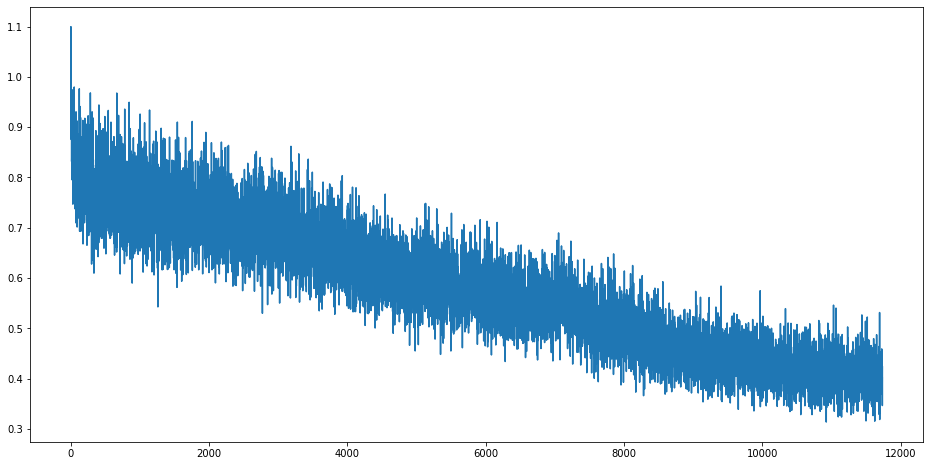

In [99]:
f = plt.figure(figsize=(16,8))


plt.plot(train_res_recon_error[500:])

In [21]:
len(train_res_recon_error)

200000

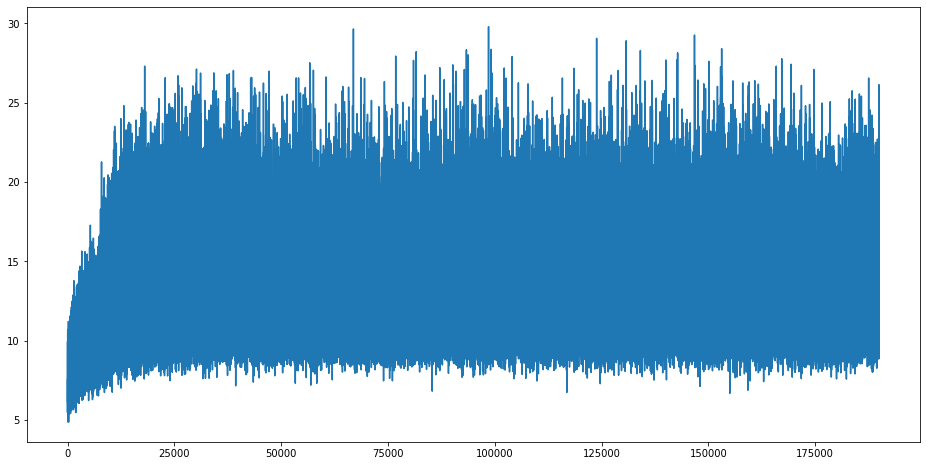

In [22]:

f = plt.figure(figsize=(16,8))
plt.plot(train_res_perplexity[10000:])

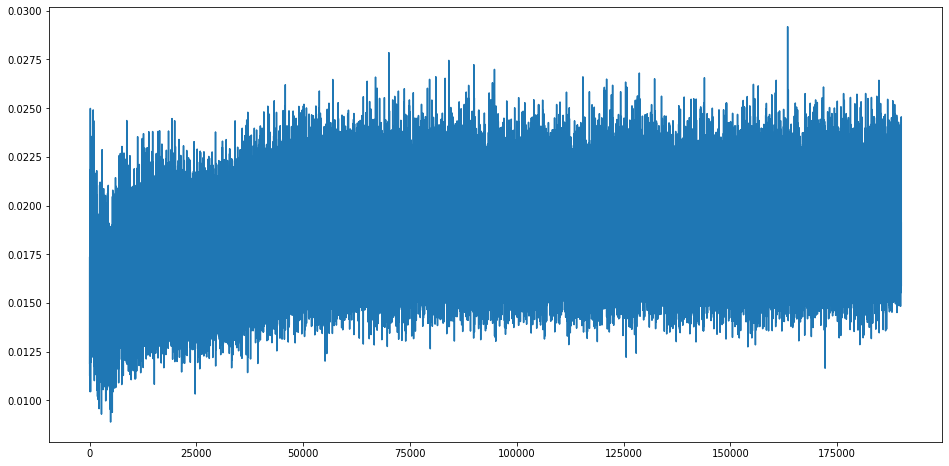

In [25]:
f = plt.figure(figsize=(16,8))
plt.plot(train_res_vq_loss[10000:])

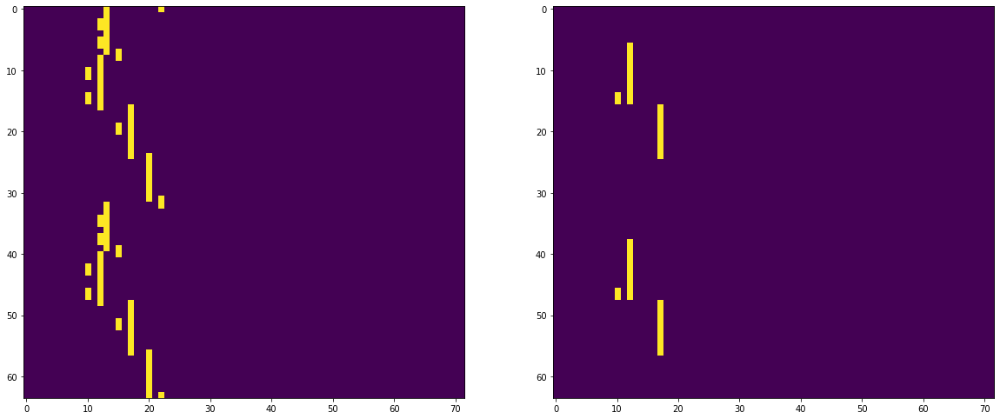

In [75]:
n = 4
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(x[n].detach().cpu().numpy() > 0.5)
plt.subplot(1, 2, 2)
plt.imshow(data_recon[n].detach().cpu().numpy() > 0.5)


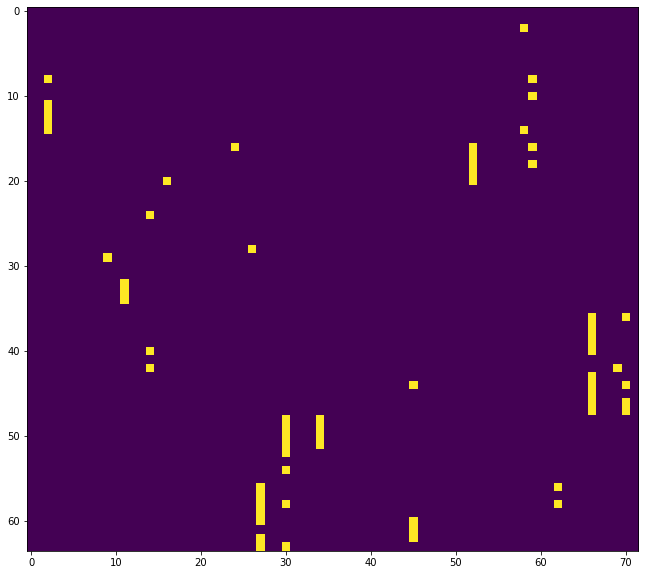

In [29]:
z = torch.rand([1, 8, 4, 6]).to(device)
fake = model.decoder(z)
plt.figure(figsize=(20, 10))
plt.imshow(fake[0].detach().cpu().numpy() > 0.5)

In [38]:
np.save('loss8.npy', np.array([train_res_recon_error, train_res_perplexity, train_res_vq_loss]))

In [75]:
r = []
p = []
v = []

In [30]:
model.eval()

Model(
  (encoder): Bar_Encoder(
    (conv): Sequential(
      (0): CompressBlock(
        (transconv): Conv3d(1, 16, kernel_size=(1, 1, 4), stride=(1, 1, 4))
        (layernorm): LayerNorm()
      )
      (1): CompressBlock(
        (transconv): Conv3d(16, 32, kernel_size=(1, 2, 1), stride=(1, 2, 1))
        (layernorm): LayerNorm()
      )
      (2): CompressBlock(
        (transconv): Conv3d(32, 64, kernel_size=(1, 3, 1), stride=(1, 3, 1))
        (layernorm): LayerNorm()
      )
      (3): CompressBlock(
        (transconv): Conv3d(64, 64, kernel_size=(1, 1, 3), stride=(1, 1, 3))
        (layernorm): LayerNorm()
      )
      (4): CompressBlock(
        (transconv): Conv3d(64, 128, kernel_size=(1, 4, 1), stride=(1, 4, 1))
        (layernorm): LayerNorm()
      )
      (5): Conv3d(128, 8, kernel_size=(1, 1, 1), stride=(1, 1, 1))
    )
    (mapping): Sequential(
      (0): Linear(in_features=8, out_features=8, bias=True)
      (1): BatchNorm1d(8, eps=1e-05, momentum=0.1, affine=True,

In [31]:
def piano_rolls_to_midi(piano_rolls, program_nums=None, is_drum=None, velocity=100, tempo=120.0, beat_resolution=24):
    if len(piano_rolls) != len(program_nums) or len(piano_rolls) != len(is_drum):
        print( "Error: piano_rolls and program_nums have different sizes...")
        return False
    if not program_nums:
        program_nums = [0, 0, 0]
    if not is_drum:
        is_drum = [False, False, False]
    # Create a PrettyMIDI object
    midi = pretty_midi.PrettyMIDI(initial_tempo=tempo)
    # Iterate through all the input instruments
    for idx in range(len(piano_rolls)):
        # Create an Instrument object
        instrument = pretty_midi.Instrument(program=program_nums[idx], is_drum=is_drum[idx])
        # Set the piano roll to the Instrument object
        set_piano_roll_to_instrument(piano_rolls[idx], instrument, velocity, tempo, beat_resolution)
        # Add the instrument to the PrettyMIDI object
        midi.instruments.append(instrument)
    return midi
def set_piano_roll_to_instrument(piano_roll, instrument, velocity=100, tempo=120.0, beat_resolution=24):
    # Calculate time per pixel
    tpp = 60.0/tempo/float(beat_resolution)
    # Create piano_roll_search that captures note onsets and offsets
    piano_roll = piano_roll.reshape((piano_roll.shape[0] * piano_roll.shape[1], piano_roll.shape[2]))
    piano_roll_diff = np.concatenate((np.zeros((1,128),dtype=int), piano_roll, np.zeros((1,128),dtype=int)))  
    piano_roll_search = np.diff(piano_roll_diff.astype(int), axis=0)
    # Iterate through all possible(128) pitches
    for note_num in range(128):
        # Search for notes
        start_idx = (piano_roll_search[:,note_num] > 0).nonzero()
        start_time = tpp*(start_idx[0].astype(float))
        end_idx = (piano_roll_search[:,note_num] < 0).nonzero()
        end_time = tpp*(end_idx[0].astype(float))
        # Iterate through all the searched notes
        for idx in range(len(start_time)):
            # Create an Note object with corresponding note number, start time and end time
            note = pretty_midi.Note(velocity=velocity, pitch=note_num, start=start_time[idx], end=end_time[idx])
            # Add the note to the Instrument object
            instrument.notes.append(note)
    # Sort the notes by their start time
    instrument.notes.sort(key=lambda note: note.start)

#_Bass_, _Drums_, _Guitar_,_Strings_, _Piano_.
#*Drums*, *Piano*, *Guitar*, *Bass*, *Ensemble*, *Reed*, *Synth Lead* and *Synth Pad*.
def get_midis(bars):
    padded_bars = np.concatenate((np.zeros((bars.shape[0], bars.shape[1], 24, bars.shape[3])), bars, np.zeros((bars.shape[0], bars.shape[1], 32, bars.shape[3]))), axis=2)

    images_with_pause = padded_bars
    images_with_pause = images_with_pause.reshape(-1, 384, padded_bars.shape[2], padded_bars.shape[3])
    images_with_pause_list = []
    for ch_idx in range(padded_bars.shape[3]):
        images_with_pause_list.append(images_with_pause[:,:,:,ch_idx].reshape(images_with_pause.shape[0],  \
                                                        images_with_pause.shape[1], images_with_pause.shape[2]))
    return piano_rolls_to_midi(images_with_pause_list, program_nums = programs, 
                               is_drum= is_drums,
                               tempo=120.0)

In [32]:
def midi2pr(pm, pps = 8):
    # pps pixel per second
    l = 576#math.ceil(pm.get_end_time() * pps // 96) * 96
    l = math.floor(pm.get_end_time() * pps / 96) * 96
    pr = np.zeros([l, 72, len(pm.instruments)], dtype = bool)
    isD = []
    for ins in range(len(pm.instruments)):
        #intervals = np.array([[int(note.start * pps), int(note.end * pps), note.pitch] for note in pm.instruments[ins].notes])
        for note in pm.instruments[ins].notes:
            if(note.end * pps > l):
                break
            if( note.pitch > 95):
                continue
            pr[math.floor(note.start * pps): math.ceil(note.end * pps), note.pitch - 24, ins] = 1
        
    return pr

In [33]:
import math

In [34]:
tmpdata =[]
path = "../A1/carlos/all/352 Blinding Lights.mid"
drum = -1
cnt = 0

Azero = np.array([0])
#find the drum track first 
pm = pretty_midi.PrettyMIDI(path)
for i in range(len(pm.instruments)):
    if(pm.instruments[i].is_drum):
        drum = i
        cnt += 1

pr = midi2pr(pm)
if(drum != -1):
    pr = np.concatenate([pr[..., [drum]], pr[..., :drum], pr[..., 1 + drum: ]], axis = -1)
    drum = 1
else:
    pr = np.concatenate([np.zeros([pr.shape[0], pr.shape[1], 1]), pr[..., [drum]]], axis = -1)
    drum = 0
cnt = pr.shape[-1]
n_bar = int(pr.shape[0] // 96)
ndrum = 4
if(cnt > 4):#none drum track >=4
    pdif = np.abs(np.diff(pr, n = 1, axis = 1)).sum(0).sum(0)
    psum = pr.sum(0).sum(0)
    pdif[0] = -111
    psum[0] = -111
    arg_pdif = np.concatenate([Azero, np.argpartition(pdif, -ndrum)[-ndrum:]], axis = 0)
    arg_psum = np.concatenate([Azero, np.argpartition(psum, -ndrum)[-ndrum:]], axis = 0)            

    tmp = pr[..., arg_pdif].reshape(-1, 96, 72, 5).transpose(0, 3, 1, 2)
    tmpdata.append(tmp)
    tmp = pr[..., arg_psum].reshape(-1, 96, 72, 5).transpose(0, 3, 1, 2)
    tmpdata.append(tmp)

    for i in range(2):
        tracks_order = np.concatenate([Azero, np.random.choice(range(1, cnt), ndrum, False)] , axis = 0)
        tmp = pr[..., tracks_order].reshape(-1, 96, 72, 5).transpose(0, 3, 1, 2)
        tmpdata[tmp.shape[0]].append(tmp)
else:
    pr = np.concatenate([pr, np.zeros([pr.shape[0], pr.shape[1], 5 - pr.shape[2]])], axis = -1)
    for i in range(3):
        tracks_order = np.concatenate([Azero, np.random.choice(range(1, 5), ndrum, False)] , axis = 0)

        tmp = pr[..., tracks_order].reshape(-1, 96, 72, 5).transpose(0, 3, 1, 2)
        tmpdata.append(tmp)

/usr/local/lib/python3.8/dist-packages/pretty_midi/pretty_midi.py:97: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  warnings.warn(


In [39]:
model.eval()

real = torch.from_numpy(tmpdata[1]).to(device).float()
real_shape = real.shape

real = real.reshape(-1,  real_shape[2],  real_shape[3])
z = real.to(device)
_, real_recon, _ = model(z)
real_recon = real_recon.reshape(real_shape[0],  real_shape[1], real_recon.shape[1], real_recon.shape[2])
real_recon.shape

torch.Size([5, 5, 96, 72])

In [40]:
model.eval()

fake1 = real_recon.cpu().detach().numpy()
fake1 = fake1.transpose(0, 2, 3, 1)

fake2 = np.stack([fake1] * 4, axis = 2)
fake2 = fake2.reshape(fake2.shape[0], -1, fake2.shape[3], fake2.shape[4])
pm = get_midis(fake2  > 0.5)
midi_audio = pm.fluidsynth(fs = 44100)

IPython.display.Audio(midi_audio, rate = 44100)

In [78]:
for i in range(1, 21):
    check_path = 'model4/musevq_v1e{}.pth'.format(10000 * i)
    checkpoint = torch.load(check_path)
    model.load_state_dict(checkpoint['model'])
    recon = 0
    vql   = 0
    perpl = 0
    num = 20
    for j in range(num):
        data = next(iter(data_loader))
        data = data[0].to(device).detach()

        vq_loss, data_recon, perplexity = model(data)
        recon_error = F.mse_loss(data_recon, data) / data_variance

        recon += recon_error.item()
        perpl += perplexity.item()
        vql   += vq_loss.item()
    r.append(recon / num)
    p.append(perpl / num)
    v.append(vql / num)

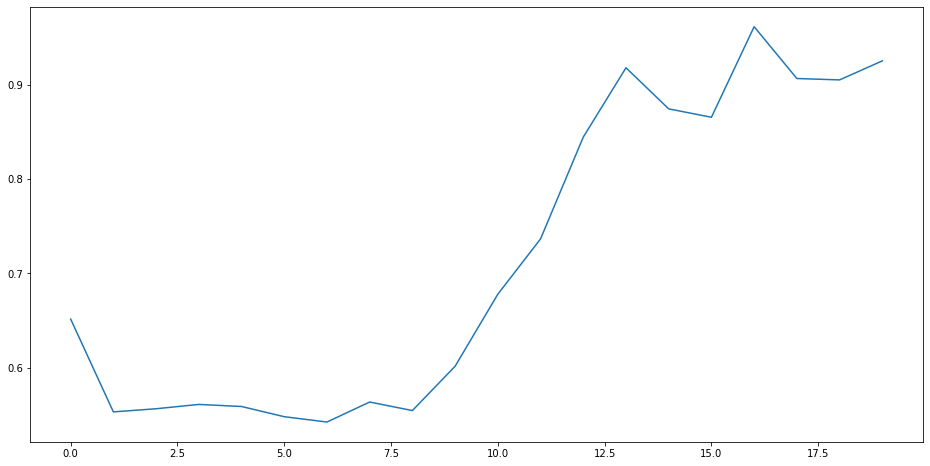

In [79]:
f = plt.figure(figsize=(16,8))
plt.plot(r)

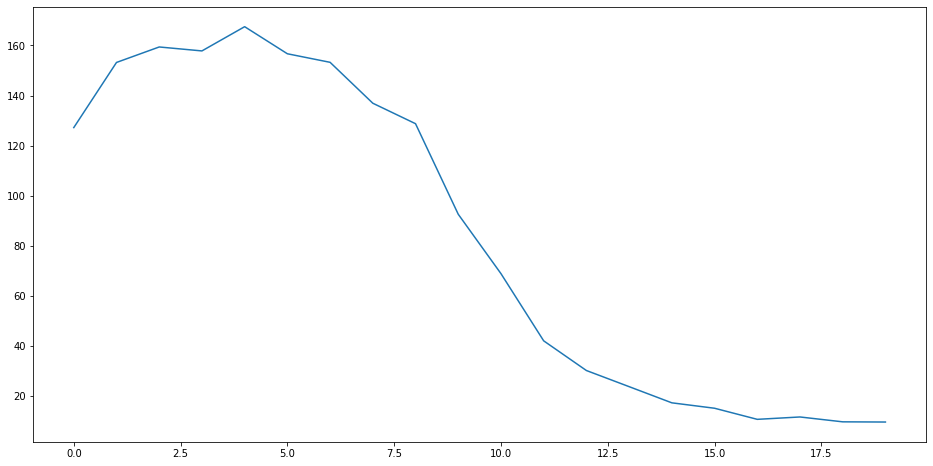

In [80]:
f = plt.figure(figsize=(16,8))
plt.plot(p)

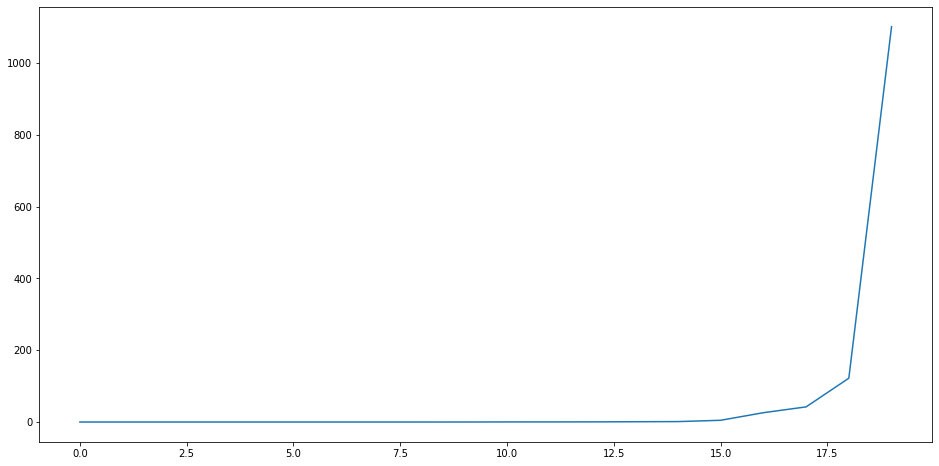

In [82]:
f = plt.figure(figsize=(16,8))
plt.plot(v)

## Evaluate

In [18]:
def piano_rolls_to_midi(piano_rolls, program_nums=None, is_drum=None, velocity=100, tempo=120.0, beat_resolution=24):
    if len(piano_rolls) != len(program_nums) or len(piano_rolls) != len(is_drum):
        print( "Error: piano_rolls and program_nums have different sizes...")
        return False
    if not program_nums:
        program_nums = [0, 0, 0]
    if not is_drum:
        is_drum = [False, False, False]
    # Create a PrettyMIDI object
    midi = pretty_midi.PrettyMIDI(initial_tempo=tempo)
    # Iterate through all the input instruments
    for idx in range(len(piano_rolls)):
        # Create an Instrument object
        instrument = pretty_midi.Instrument(program=program_nums[idx], is_drum=is_drum[idx])
        # Set the piano roll to the Instrument object
        set_piano_roll_to_instrument(piano_rolls[idx], instrument, velocity, tempo, beat_resolution)
        # Add the instrument to the PrettyMIDI object
        midi.instruments.append(instrument)
    return midi
def set_piano_roll_to_instrument(piano_roll, instrument, velocity=100, tempo=120.0, beat_resolution=24):
    # Calculate time per pixel
    tpp = 60.0/tempo/float(beat_resolution)
    # Create piano_roll_search that captures note onsets and offsets
    piano_roll = piano_roll.reshape((piano_roll.shape[0] * piano_roll.shape[1], piano_roll.shape[2]))
    piano_roll_diff = np.concatenate((np.zeros((1,128),dtype=int), piano_roll, np.zeros((1,128),dtype=int)))  
    piano_roll_search = np.diff(piano_roll_diff.astype(int), axis=0)
    # Iterate through all possible(128) pitches
    for note_num in range(128):
        # Search for notes
        start_idx = (piano_roll_search[:,note_num] > 0).nonzero()
        start_time = tpp*(start_idx[0].astype(float))
        end_idx = (piano_roll_search[:,note_num] < 0).nonzero()
        end_time = tpp*(end_idx[0].astype(float))
        # Iterate through all the searched notes
        for idx in range(len(start_time)):
            # Create an Note object with corresponding note number, start time and end time
            note = pretty_midi.Note(velocity=velocity, pitch=note_num, start=start_time[idx], end=end_time[idx])
            # Add the note to the Instrument object
            instrument.notes.append(note)
    # Sort the notes by their start time
    instrument.notes.sort(key=lambda note: note.start)

#_Bass_, _Drums_, _Guitar_,_Strings_, _Piano_.
#*Drums*, *Piano*, *Guitar*, *Bass*, *Ensemble*, *Reed*, *Synth Lead* and *Synth Pad*.
def get_midis(bars):
    padded_bars = np.concatenate((np.zeros((bars.shape[0], bars.shape[1], 24, bars.shape[3])), bars, np.zeros((bars.shape[0], bars.shape[1], 32, bars.shape[3]))), axis=2)

    images_with_pause = padded_bars
    images_with_pause = images_with_pause.reshape(-1, 384, padded_bars.shape[2], padded_bars.shape[3])
    images_with_pause_list = []
    for ch_idx in range(padded_bars.shape[3]):
        images_with_pause_list.append(images_with_pause[:,:,:,ch_idx].reshape(images_with_pause.shape[0],  \
                                                        images_with_pause.shape[1], images_with_pause.shape[2]))
    return piano_rolls_to_midi(images_with_pause_list, program_nums = programs, 
                               is_drum= is_drums,
                               tempo=120.0)

In [100]:
check_path = 'model7/musevq_v1e{}.pth'.format(200000)
checkpoint = torch.load(check_path)
model.load_state_dict(checkpoint['model'])

FileNotFoundError: [Errno 2] No such file or directory: 'model7/musevq_v1e200000.pth'

In [91]:
model.eval()
#real = next(iter(data_loader))
#real = real[0].to(device)
z = model.encoder(real)
loss, z_q, perplexity, _ = model.VQ(z)
real_recon = model.decoder(z_q)


In [92]:
real_recon.shape

torch.Size([32, 5, 64, 72])

In [93]:
start = 16
end = start + 3

In [94]:

fake1 = real.cpu().detach().numpy().transpose(0, 2, 3, 1)[start: end]

fake2 = np.stack([fake1] * 6, axis = 2)
fake2 = fake2.reshape(fake2.shape[0], -1, fake2.shape[3], fake2.shape[4])

pm = get_midis(fake2  > 0.5)
midi_audio = pm.fluidsynth(fs = 44100)

IPython.display.Audio(midi_audio, rate = 44100)

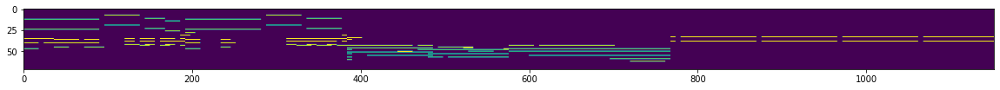

In [95]:

plt.figure(figsize=(20, 10))

plt.imshow(fake2[:, :, :, 1].reshape(fake2.shape[0] * fake2.shape[1], fake2.shape[2],).transpose([1, 0]) > 0.5)


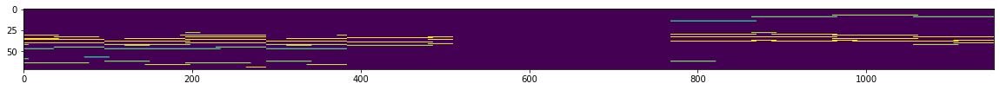

In [96]:

plt.figure(figsize=(20, 10))

plt.imshow(fake2[:, :, :, 4].reshape(fake2.shape[0] * fake2.shape[1], fake2.shape[2],).transpose([1, 0]) > 0.5)


In [97]:

fake1 = real_recon.cpu().detach().numpy().transpose(0, 2, 3, 1)[start:end]

fake2 = np.stack([fake1] * 6, axis = 2)
fake2 = fake2.reshape(fake2.shape[0], -1, fake2.shape[3], fake2.shape[4])

pm = get_midis(fake2  > 0.5)
midi_audio = pm.fluidsynth(fs = 44100)

IPython.display.Audio(midi_audio, rate = 44100)

In [88]:

fake1 = real_recon.cpu().detach().numpy().transpose(0, 2, 3, 1)[start:end]

fake2 = np.stack([fake1] * 6, axis = 2)
fake2 = fake2.reshape(fake2.shape[0], -1, fake2.shape[3], fake2.shape[4])

pm = get_midis(fake2  > 0.5)
midi_audio = pm.fluidsynth(fs = 44100)

IPython.display.Audio(midi_audio, rate = 44100)

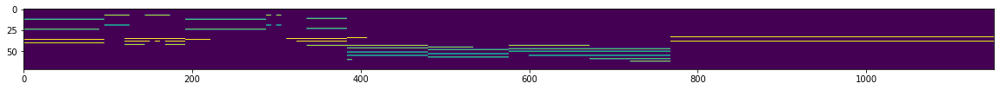

In [89]:

plt.figure(figsize=(20, 10))

plt.imshow(fake2[:, :, :, 1].reshape(fake2.shape[0] * fake2.shape[1], fake2.shape[2],).transpose([1, 0]) > 0.5)


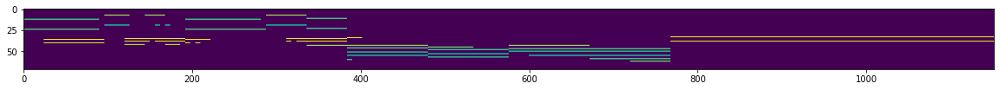

In [99]:

plt.figure(figsize=(20, 10))

plt.imshow(fake2[:, :, :, 1].reshape(fake2.shape[0] * fake2.shape[1], fake2.shape[2],).transpose([1, 0]) > 0.5)


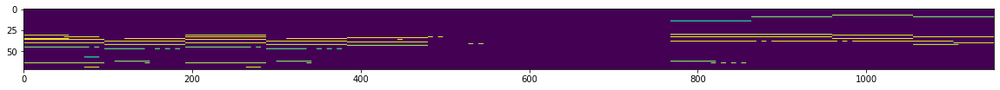

In [73]:

plt.figure(figsize=(20, 10))

plt.imshow(fake2[:, :, :, 4].reshape(fake2.shape[0] * fake2.shape[1], fake2.shape[2],).transpose([1, 0]) > 0.5)


In [22]:
pm.write("recon.mid")

In [49]:
#r_latent = torch.randn(1, latent_dim).to(device)


In [ ]:
torch.save({
                'discriminator'      : discriminator.state_dict(),
                'generator'   : generator.state_dict(),
                'd_optimizer'   : d_optimizer.state_dict(),
                'g_optimizer'   : g_optimizer.state_dict(),
            }, './musegan_v3e{}.pth'.format(80000 + step),_use_new_zipfile_serialization= False)

In [33]:

from torchviz import make_dot

In [46]:
model.eval()
real = next(iter(data_loader))
real = real[0].to(device)
z_m, z_b = model.encoder(real)
loss_m, z_q_m, perplexity_m, _ = model.VQ_m(z_m)
z_b = z_b.view(-1, latent_dim // 2 * n_tracks, latent_w, latent_h)
loss_b, z_q_b, perplexity_b, _ = model.VQ_b(z_b)
z_q_b = z_q_b.view(-1, n_tracks, latent_dim // 2, latent_w, latent_h)
real_recon = model.decoder(z_q_m, z_q_b)


In [52]:
model.eval()
real = next(iter(data_loader))
real = real[0].to(device)
z_m, z_b = model.encoder(real)
g = make_dot(z_b)
g.render('ZM', view=False) 

'ZM.pdf'

In [ ]:
model.eval()
real = next(iter(data_loader))
real = real[0].to(device)
z_m, z_b = model.encoder(real)
loss_m, z_q_m, perplexity_m, _ = model.VQ_m(z_m)
z_b = z_b.view(-1, latent_dim // 2 * n_tracks, latent_w, latent_h)
loss_b, z_q_b, perplexity_b, _ = model.VQ_b(z_b)
z_q_b = z_q_b.view(-1, n_tracks, latent_dim // 2, latent_w, latent_h)
real_recon = model.decoder(z_q_m, z_q_b)
